# PHASE:4

## Cell 1 — Install dependencies

In [2]:
import subprocess, sys
def _pip_install(pkg):
    subprocess.run([sys.executable, "-m", "pip", "install", "-q", pkg], check=False)

for pkg in ["ultralytics", "grad-cam", "opencv-python-headless"]:
    _pip_install(pkg)

import torch
print("Torch:", torch.__version__, "| CUDA available:", torch.cuda.is_available())
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
print("Using device:", DEVICE)

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 kB 1.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 11.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.0/66.0 kB 4.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.5/44.5 kB 1.2 MB/s eta 0:00:00
Torch: 2.10.0+cu128 | CUDA available: True
Using device: cuda


## Cell 2 — Imports

In [3]:
import os, json, glob, random, shutil
import numpy as np
import pandas as pd
import cv2
import matplotlib.pyplot as plt
import torch

from ultralytics import YOLO
from pytorch_grad_cam import EigenCAM, GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image

print("Imports OK")

Creating new Ultralytics Settings v0.0.7 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart#ultralytics-settings.
Imports OK


## Cell 3 — Configuration

In [4]:
SEED = 42
IMG_SIZE = 640
CONF_THRESHOLD = 0.25          # detection confidence used for inference/case-mining in this notebook
IOU_MATCH_THRESHOLD = 0.50     # for matching predicted boxes to ground-truth boxes (TP/FP/FN)
N_CASES_PER_CATEGORY = 4       # how many representative cases to try to collect per failure category
HIGH_SEVERITY = 4              # which Phase 3 severity level counts as "high" for case mining
MEDIUM_SEVERITY = 2

random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)

OUTPUT_ROOT   = "/kaggle/working/phase4_xai"
FIGURES_DIR   = os.path.join(OUTPUT_ROOT, "figures")
RESULTS_DIR   = os.path.join(OUTPUT_ROOT, "results")
PLOTS_DIR     = os.path.join(OUTPUT_ROOT, "plots")
CONFIG_DIR    = os.path.join(OUTPUT_ROOT, "config")
LOGS_DIR      = os.path.join(OUTPUT_ROOT, "logs")

for sub in ["clean_tp", "clean_fp", "clean_fn", "gaussian_noise", "motion_blur", "low_light", "comparison"]:
    os.makedirs(os.path.join(FIGURES_DIR, sub), exist_ok=True)
for d in [RESULTS_DIR, PLOTS_DIR, CONFIG_DIR, LOGS_DIR]:
    os.makedirs(d, exist_ok=True)

DPI = 300
print("Phase 4 configuration loaded.")
print("IOU_MATCH_THRESHOLD:", IOU_MATCH_THRESHOLD, "| CONF_THRESHOLD:", CONF_THRESHOLD)

Phase 4 configuration loaded.
IOU_MATCH_THRESHOLD: 0.5 | CONF_THRESHOLD: 0.25


## Cell 4 — Locate Phase 3 outputs and best.pt (no path guessed silently)

In [5]:
import glob

def find_phase3_root():
    """Find the Phase 3 output root by locating a directory that contains both
    'phase3_config.json' and 'degraded_datasets' as direct children. This works
    whether Phase 3 ran in THIS session (/kaggle/working/phase3_robustness) or was
    supplied as a Kaggle Input dataset (/kaggle/input/<dataset-name>/...) -- we
    never hardcode which root it lives under."""
    candidates = []
    for root in ("/kaggle/input", "/kaggle/working"):
        for config_path in glob.glob(os.path.join(root, "**", "phase3_config.json"), recursive=True):
            d = os.path.dirname(config_path)
            if os.path.isdir(os.path.join(d, "degraded_datasets")):
                candidates.append(d)
    return sorted(set(candidates))

phase3_root_candidates = find_phase3_root()
print("Phase 3 root candidates found:")
for c in phase3_root_candidates:
    print("  -", c)

if not phase3_root_candidates:
    raise FileNotFoundError(
        "No Phase 3 output found under /kaggle/input or /kaggle/working (looking for a "
        "folder containing both 'phase3_config.json' and 'degraded_datasets'). Add the "
        "Phase 3 output zip as a Kaggle Input dataset, or re-run Phase 3 in this session."
    )

# >>> If multiple candidates were found and the wrong one was picked, override manually here <<<
PHASE3_ROOT = phase3_root_candidates[0]
phase3_config_path = os.path.join(PHASE3_ROOT, "phase3_config.json")
print("\nUsing Phase 3 root:", PHASE3_ROOT)

with open(phase3_config_path) as f:
    phase3_config = json.load(f)
print("\nLoaded phase3_config.json:")
for k, v in phase3_config.items():
    print(f"  {k}: {v}")

bundled_model = os.path.join(PHASE3_ROOT, "model", "best.pt")
if os.path.exists(bundled_model):
    BEST_MODEL_PATH = bundled_model
    print("\nUsing BUNDLED best.pt from the Phase 3 output.")
elif phase3_config.get("model_path") and os.path.exists(phase3_config["model_path"]):
    BEST_MODEL_PATH = phase3_config["model_path"]
else:
    candidates = glob.glob("/kaggle/input/**/best.pt", recursive=True) + glob.glob("/kaggle/working/**/best.pt", recursive=True)
    candidates = sorted(set(candidates))
    print("\nSearching for best.pt (bundled copy and config path unavailable)...")
    for c in candidates:
        print("  -", c)
    if not candidates:
        raise FileNotFoundError("No best.pt found anywhere. Set BEST_MODEL_PATH manually.")
    BEST_MODEL_PATH = candidates[0]

print("Using BEST_MODEL_PATH:", BEST_MODEL_PATH)

bundled_clean_images = os.path.join(PHASE3_ROOT, "clean_test_set", "images")
bundled_clean_labels = os.path.join(PHASE3_ROOT, "clean_test_set", "labels")
if os.path.isdir(bundled_clean_images):
    TEST_IMAGES_DIR = bundled_clean_images
    TEST_LABELS_DIR = bundled_clean_labels
    print("Using BUNDLED clean test images from the Phase 3 output.")
elif phase3_config.get("test_images_dir") and os.path.isdir(phase3_config["test_images_dir"]):
    TEST_IMAGES_DIR = phase3_config["test_images_dir"]
    TEST_LABELS_DIR = phase3_config.get("test_labels_dir", TEST_IMAGES_DIR.replace("images", "labels"))
else:
    cands = glob.glob("/kaggle/input/**/test/images", recursive=True) + glob.glob("/kaggle/working/**/test/images", recursive=True)
    if not cands:
        raise FileNotFoundError("No test/images directory found. Set TEST_IMAGES_DIR manually.")
    TEST_IMAGES_DIR = cands[0]
    TEST_LABELS_DIR = TEST_IMAGES_DIR.replace("images", "labels")

CLASS_NAMES = phase3_config.get("class_names", ["Fire", "Smoke"])
NUM_CLASSES = len(CLASS_NAMES)

print("TEST_IMAGES_DIR:", TEST_IMAGES_DIR)
print("TEST_LABELS_DIR:", TEST_LABELS_DIR)
print("CLASS_NAMES:", CLASS_NAMES)

DEGRADED_DIR = os.path.join(PHASE3_ROOT, "degraded_datasets")
DEGRADATION_DIRS = {
    "Gaussian Noise": os.path.join(DEGRADED_DIR, "gaussian_noise"),
    "Motion Blur": os.path.join(DEGRADED_DIR, "motion_blur"),
    "Low Light": os.path.join(DEGRADED_DIR, "low_light"),
}
for name, d in DEGRADATION_DIRS.items():
    print(f"{name} degraded dir exists: {os.path.isdir(d)} -> {d}")

Phase 3 root candidates found:
  - /kaggle/input/datasets/sadiahaiderjaima/phase-4-robustness

Using Phase 3 root: /kaggle/input/datasets/sadiahaiderjaima/phase-4-robustness

Loaded phase3_config.json:
  model_path: /kaggle/input/datasets/sadiahaiderjaima/yolov11s/best.pt
  model_name: YOLO11s
  img_size: 640
  conf_threshold_reported: 0.25
  eval_conf_used_for_map: 0.001
  iou_threshold: 0.7
  seed: 42
  class_names: ['Fire', 'Smoke']
  degradation_types: ['gaussian_noise', 'motion_blur', 'low_light']
  severity_params: {'gaussian_noise_std': {'1': 0.03, '2': 0.06, '3': 0.1, '4': 0.15}, 'motion_blur_kernel': {'1': 5, '2': 9, '3': 13, '4': 17}, 'low_light_factor': {'1': 0.8, '2': 0.6, '3': 0.4, '4': 0.2}}
  test_images_dir: /kaggle/working/fire_smoke_detection-4/test/images
  test_labels_dir: /kaggle/working/fire_smoke_detection-4/test/labels
  output_root: /kaggle/working/phase3_robustness

Using BUNDLED best.pt from the Phase 3 output.
Using BEST_MODEL_PATH: /kaggle/input/datasets/sa

## Cell 5 — Load YOLO11s (inference only, no gradient updates to weights)

In [6]:
yolo_model = YOLO(BEST_MODEL_PATH)
yolo_model.to(DEVICE)
torch_model = yolo_model.model          # underlying nn.Module (needed for CAM hooks)
torch_model.eval()

for p in torch_model.parameters():
    p.requires_grad_(True)   # gradients needed for Grad-CAM w.r.t. INPUT activations, not for updating weights
                              # (no optimizer/step is ever created in this notebook, so weights cannot change)

print("Model loaded from:", BEST_MODEL_PATH)
print("Task:", yolo_model.task)
print("Number of classes reported by model:", len(yolo_model.names), "->", yolo_model.names)
# Warm-up forward pass in a NORMAL (non-inference-mode) context so that any
# lazily-cached buffers inside the Detect head (anchors/strides) are created as
# regular autograd-compatible tensors, not "inference tensors". If Ultralytics'
# predict() (which internally uses torch.inference_mode()) ran first instead,
# it would cache those buffers as inference tensors, and any later Grad-CAM
# backward pass would fail with "Inference tensors cannot be saved for backward."
_warm_tensor = torch.zeros(1, 3, IMG_SIZE, IMG_SIZE, device=DEVICE)
with torch.no_grad():
    _ = torch_model(_warm_tensor)
print("Warm-up forward pass done (avoids inference-mode tensor poisoning for later Grad-CAM calls).")

Model loaded from: /kaggle/input/datasets/sadiahaiderjaima/phase-4-robustness/model/best.pt
Task: detect
Number of classes reported by model: 2 -> {0: 'Fire', 1: 'Smoke'}
Warm-up forward pass done (avoids inference-mode tensor poisoning for later Grad-CAM calls).


## Cell 6 — Inspect architecture and auto-select a candidate CAM target layer

In [7]:
# The Ultralytics Sequential backbone/neck/head lives at torch_model.model (an nn.ModuleList/Sequential).
# We print every top-level block and its type, then pick the last block BEFORE the block whose class
# name contains "Detect" as the candidate CAM layer -- this is the standard choice used in the
# reference EigenCAM-for-YOLO implementations (a late, high-semantic, still-spatial feature map).

blocks = list(torch_model.model.children())
detect_idx = None
for i, b in enumerate(blocks):
    cls_name = b.__class__.__name__
    print(f"[{i:2d}] {cls_name}")
    if "Detect" in cls_name:
        detect_idx = i

if detect_idx is None:
    raise RuntimeError("Could not locate a Detect-family head in torch_model.model -- inspect the printout above manually.")

CANDIDATE_LAYER_IDX = detect_idx - 1
target_layer = blocks[CANDIDATE_LAYER_IDX]
print(f"\nDetect head found at index {detect_idx}: {blocks[detect_idx].__class__.__name__}")
print(f"Candidate CAM target layer -> index {CANDIDATE_LAYER_IDX}: {target_layer.__class__.__name__}")
print("\nSelected CAM Layer:")
print(f"  torch_model.model[{CANDIDATE_LAYER_IDX}] ({target_layer.__class__.__name__})")
print("Reasoning: last feature-producing block before the detection head -- deep enough for")
print("semantic (class-relevant) features, still spatial enough (not yet flattened/decoded) to")
print("localize where those features come from in the image.")

[ 0] Conv
[ 1] Conv
[ 2] C3k2
[ 3] Conv
[ 4] C3k2
[ 5] Conv
[ 6] C3k2
[ 7] Conv
[ 8] C3k2
[ 9] SPPF
[10] C2PSA
[11] Upsample
[12] Concat
[13] C3k2
[14] Upsample
[15] Concat
[16] C3k2
[17] Conv
[18] Concat
[19] C3k2
[20] Conv
[21] Concat
[22] C3k2
[23] Detect

Detect head found at index 23: Detect
Candidate CAM target layer -> index 22: C3k2

Selected CAM Layer:
  torch_model.model[22] (C3k2)
Reasoning: last feature-producing block before the detection head -- deep enough for
semantic (class-relevant) features, still spatial enough (not yet flattened/decoded) to
localize where those features come from in the image.


## Cell 7 — Test EigenCAM and Grad-CAM compatibility on a clean + a degraded image

Both methods are tested on the SAME two images so their outputs are directly comparable.
EigenCAM is expected to run without errors (it only needs a forward pass + hooked activations,
no class-specific gradient). Grad-CAM additionally needs a class-specific scalar to backpropagate
from -- for a dense detection head (no single "logit" like in classification) we use the highest
class-confidence score for the target class across all anchors as that scalar. This is a pragmatic
adaptation (analogous to backpropagating from the top logit in classification Grad-CAM), not a
claim that it is the only valid choice.

Preprocessing + box-anchored CAM target utilities ready.
Sample clean image   : /kaggle/input/datasets/sadiahaiderjaima/phase-4-robustness/clean_test_set/images/20_jpg.rf.d5013ab1f49bae6b45657b298b2b4af7.jpg
Sample degraded image: /kaggle/input/datasets/sadiahaiderjaima/phase-4-robustness/degraded_datasets/low_light/severity_4/images/0133_jpg.rf.3348276575bd0690d858b1eef76366c8.jpg
Anchor detection found: class=Smoke, conf=0.77, box=[234.38848876953125, 286.53509521484375, 568.31884765625, 398.03973388671875]

Raw torch_model(x) output shape (informational): torch.Size([1, 6, 8400]) | type: <class 'tuple'>

EigenCAM: ran successfully. Output range: 0.0 - 0.9999999
Grad-CAM: ran successfully for all classes: ['Fire', 'Smoke']


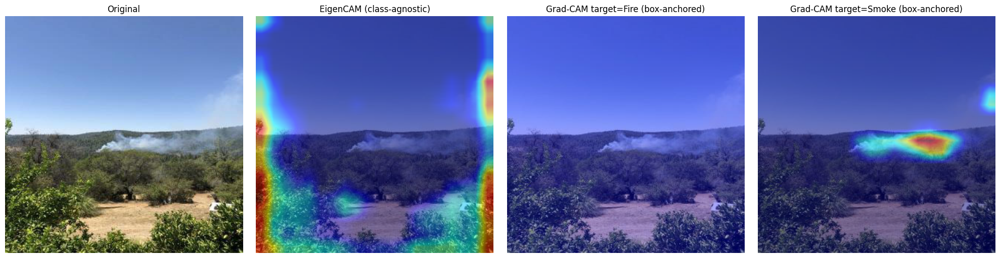


Compatibility check figure saved to: /kaggle/working/phase4_xai/logs/xai_compatibility_test.png
Inspect it: if the Grad-CAM(Fire) and Grad-CAM(Smoke) panels look visibly DIFFERENT
from each other (and concentrate near the anchor box, if one was found),
Grad-CAM is providing class-discriminative, object-tied signal as intended.


In [8]:
def preprocess_image(img_path, imgsz=IMG_SIZE):
    img_bgr = cv2.imread(img_path)
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    img_resized = cv2.resize(img_rgb, (imgsz, imgsz))
    img_float = img_resized.astype(np.float32) / 255.0
    tensor = torch.from_numpy(img_float).permute(2, 0, 1).unsqueeze(0).to(DEVICE)
    tensor.requires_grad_(True)
    return img_float, tensor

def scale_box_to_input(box, orig_hw, imgsz=IMG_SIZE):
    """Rescale an [x1,y1,x2,y2] box from original-image pixel space to the
    resized (imgsz x imgsz) tensor space used for CAM generation."""
    if box is None:
        return None
    orig_h, orig_w = orig_hw
    sx, sy = imgsz / orig_w, imgsz / orig_h
    x1, y1, x2, y2 = box
    return [x1 * sx, y1 * sy, x2 * sx, y2 * sy]

def iou_xyxy_np(a, b):
    ax1, ay1, ax2, ay2 = a
    bx1, by1, bx2, by2 = b
    ix1, iy1 = np.maximum(ax1, bx1), np.maximum(ay1, by1)
    ix2, iy2 = np.minimum(ax2, bx2), np.minimum(ay2, by2)
    iw, ih = np.clip(ix2 - ix1, 0, None), np.clip(iy2 - iy1, 0, None)
    inter = iw * ih
    area_a = np.clip(ax2 - ax1, 0, None) * np.clip(ay2 - ay1, 0, None)
    area_b = np.clip(bx2 - bx1, 0, None) * np.clip(by2 - by1, 0, None)
    union = area_a + area_b - inter
    return np.where(union > 0, inter / union, 0.0)

class YOLOClassScoreTarget:
    """
    Fallback (UNANCHORED) target: backprops from the single highest class-score
    anchor anywhere in the image. Used only when no specific detection/GT box is
    available. Does NOT tie the CAM to a particular object -- expect diffuse maps.
    """
    def __init__(self, class_idx):
        self.class_idx = class_idx

    def __call__(self, model_output):
        out = model_output[0] if isinstance(model_output, (tuple, list)) else model_output
        if out.dim() == 3 and out.shape[1] >= 4 + NUM_CLASSES:
            class_scores = out[:, 4 + self.class_idx, :]
        elif out.dim() == 3 and out.shape[2] >= 4 + NUM_CLASSES:
            class_scores = out[:, :, 4 + self.class_idx]
        else:
            raise RuntimeError(f"Unexpected raw output shape {tuple(out.shape)}")
        return class_scores.max()


class YOLOBoxAnchoredTarget:
    """
    Box-anchored (PREFERRED) target: restricts the backprop target to anchors whose
    decoded box (channels 0:4 of the raw output, already in 0..imgsz pixel space)
    overlaps the box of interest above `iou_thresh`. Ties the CAM to "why did the
    model score THIS specific object as this class", not an arbitrary global max.
    """
    def __init__(self, class_idx, box_640, iou_thresh=0.10):
        self.class_idx = class_idx
        self.box_640 = np.array(box_640, dtype=np.float32)
        self.iou_thresh = iou_thresh

    def __call__(self, model_output):
        out = model_output[0] if isinstance(model_output, (tuple, list)) else model_output
        if not (out.dim() == 3 and out.shape[1] >= 4 + NUM_CLASSES):
            raise RuntimeError(f"Unexpected raw output shape {tuple(out.shape)}")
        boxes = out[0, 0:4, :].detach().cpu().numpy().T
        ious = iou_xyxy_np(boxes.T, self.box_640[:, None])
        match_idx = np.where(ious >= self.iou_thresh)[0]
        if len(match_idx) == 0:
            match_idx = np.array([int(np.argmax(ious))])
        class_scores = out[0, 4 + self.class_idx, :]
        return class_scores[match_idx].max()

print("Preprocessing + box-anchored CAM target utilities ready.")

# ---------------------------------------------------------------------------
# Compatibility test: run actual detection first, then anchor CAM to the
# detected box (if any).
# ---------------------------------------------------------------------------
#sample_clean = sorted(glob.glob(os.path.join(TEST_IMAGES_DIR, "*")))[0]
IMAGE_INDEX = 55   # <- বদলাও: 0,1,2... যেকোনো index, list-এ যতগুলো image আছে তার মধ্যে
all_clean_images = sorted(glob.glob(os.path.join(TEST_IMAGES_DIR, "*")))
sample_clean = all_clean_images[IMAGE_INDEX]
degraded_candidates = glob.glob(os.path.join(DEGRADATION_DIRS["Low Light"], f"severity_{HIGH_SEVERITY}", "images", "*"))
sample_degraded = degraded_candidates[0] if degraded_candidates else sample_clean

print("Sample clean image   :", sample_clean)
print("Sample degraded image:", sample_degraded)

det_result = yolo_model.predict(sample_clean, imgsz=IMG_SIZE, conf=CONF_THRESHOLD, verbose=False)[0]
h0, w0 = det_result.orig_shape
if len(det_result.boxes) > 0:
    best_i = int(det_result.boxes.conf.argmax())
    anchor_box_orig = det_result.boxes.xyxy[best_i].tolist()
    anchor_cls = int(det_result.boxes.cls[best_i])
    print(f"Anchor detection found: class={CLASS_NAMES[anchor_cls]}, "
          f"conf={float(det_result.boxes.conf[best_i]):.2f}, box={anchor_box_orig}")
else:
    anchor_box_orig, anchor_cls = None, 0
    print("No confident detection found on the sample clean image -- "
          "compatibility test will fall back to the UNANCHORED global-max target.")

anchor_box_640 = scale_box_to_input(anchor_box_orig, (h0, w0), IMG_SIZE) if anchor_box_orig else None

eigencam_ok = False
gradcam_ok = False

with torch.no_grad():
    _img, _tensor = preprocess_image(sample_clean)
    _raw_out = torch_model(_tensor)
    _shape_info = _raw_out[0].shape if isinstance(_raw_out, (tuple, list)) else _raw_out.shape
    print("\nRaw torch_model(x) output shape (informational):", _shape_info, "| type:", type(_raw_out))

# ---- EigenCAM test (needs a VALID target object, not None -- see note below) ----
try:
    cam_eigen = EigenCAM(torch_model, [target_layer])
    img_f, tensor = preprocess_image(sample_clean)
    # EigenCAM is gradient-free, so the target's content doesn't affect its output --
    # but pytorch-grad-cam still requires a VALID target object (passing None makes
    # it try to auto-infer a target assuming a plain classification tensor, which
    # crashes on our tuple output). We reuse the same anchored/fallback target here.
    eigen_target = (
        [YOLOBoxAnchoredTarget(anchor_cls, anchor_box_640)]
        if anchor_box_640 is not None else [YOLOClassScoreTarget(anchor_cls)]
    )
    gray_eigen = cam_eigen(input_tensor=tensor, targets=eigen_target)[0, :, :]
    eigencam_ok = True
    print("\nEigenCAM: ran successfully. Output range:", gray_eigen.min(), "-", gray_eigen.max())
except Exception as e:
    print("\nEigenCAM FAILED:", repr(e))

# ---- Grad-CAM test, anchored to the detected box when available ----
gradcam_maps = {}
try:
    cam_grad = GradCAM(torch_model, [target_layer])
    for cls_idx, cls_name in enumerate(CLASS_NAMES):
        img_f, tensor = preprocess_image(sample_clean)
        if anchor_box_640 is not None:
            targets = [YOLOBoxAnchoredTarget(cls_idx, anchor_box_640)]
        else:
            targets = [YOLOClassScoreTarget(cls_idx)]
        gray = cam_grad(input_tensor=tensor, targets=targets)[0, :, :]
        gradcam_maps[cls_name] = gray
    gradcam_ok = True
    print("Grad-CAM: ran successfully for all classes:", list(gradcam_maps.keys()))
    if anchor_box_640 is None:
        print("  (unanchored fallback was used -- Fire/Smoke maps may look similar.)")
except Exception as e:
    print("Grad-CAM FAILED:", repr(e))

# ---- Visual side-by-side check ----
if eigencam_ok or gradcam_ok:
    n_panels = 1 + int(eigencam_ok) + len(gradcam_maps)
    fig, axes = plt.subplots(1, n_panels, figsize=(5 * n_panels, 5))
    if n_panels == 1:
        axes = [axes]
    img_f, _ = preprocess_image(sample_clean)
    axes[0].imshow(img_f); axes[0].set_title("Original"); axes[0].axis("off")
    p = 1
    if eigencam_ok:
        axes[p].imshow(show_cam_on_image(img_f, gray_eigen, use_rgb=True))
        axes[p].set_title("EigenCAM (class-agnostic)"); axes[p].axis("off")
        p += 1
    for cls_name, gray in gradcam_maps.items():
        axes[p].imshow(show_cam_on_image(img_f, gray, use_rgb=True))
        title_suffix = "box-anchored" if anchor_box_640 is not None else "UNANCHORED fallback"
        axes[p].set_title(f"Grad-CAM target={cls_name} ({title_suffix})"); axes[p].axis("off")
        p += 1
    plt.tight_layout()
    plt.savefig(os.path.join(LOGS_DIR, "xai_compatibility_test.png"), dpi=DPI)
    plt.show()
    print("\nCompatibility check figure saved to:", os.path.join(LOGS_DIR, "xai_compatibility_test.png"))
    print("Inspect it: if the Grad-CAM(Fire) and Grad-CAM(Smoke) panels look visibly DIFFERENT")
    print("from each other (and concentrate near the anchor box, if one was found),")
    print("Grad-CAM is providing class-discriminative, object-tied signal as intended.")

## Cell 8 — Select XAI method

Decision rule (per the project brief -- no method is assumed superior a priori):
- If Grad-CAM ran without error AND produced usable maps for every class -> select Grad-CAM,
  because Phase 4 explicitly requires distinguishing Fire-attention from Smoke-attention, and
  EigenCAM is architecturally unable to do that (class-agnostic by construction).
- Else if only EigenCAM ran -> fall back to EigenCAM, with the limitation documented.
- Else -> stop and report the incompatibility (do not fabricate a working method).

In [9]:
if gradcam_ok:
    XAI_METHOD = "Grad-CAM"
    XAI_REASONING = (
        "Grad-CAM ran successfully on the selected layer and, when anchored to a "
        "specific detected box, can be targeted at a specific class score (Fire or "
        "Smoke). EigenCAM cannot do this by construction (class-agnostic principal "
        "component of activations). Since Phase 4 requires separating Fire-attention "
        "from Smoke-attention, Grad-CAM (box-anchored) is used as the primary method."
    )
elif eigencam_ok:
    XAI_METHOD = "EigenCAM"
    XAI_REASONING = (
        "Grad-CAM could not be run in this environment (see Cell 7 error). EigenCAM is "
        "used as a fallback. NOTE: EigenCAM is class-agnostic -- it shows where the "
        "network activates most strongly overall, and cannot on its own distinguish "
        "Fire-driven from Smoke-driven attention. Any Fire-vs-Smoke claims from EigenCAM "
        "maps should be treated as weaker evidence than a true class-targeted method."
    )
else:
    raise RuntimeError("Neither EigenCAM nor Grad-CAM ran successfully on this model/layer. "
                        "Inspect the Cell 7 errors and try a different target_layer before proceeding.")

print("Selected XAI Method:", XAI_METHOD)
print(XAI_REASONING)

def compute_cam(tensor, class_idx=None, box_640=None):
    """
    Returns a (H, W) grayscale CAM in [0, 1] for the given input tensor.
    If `box_640` (a box already scaled to the imgsz x imgsz tensor space) is given,
    the CAM is anchored to that specific object -- this is the preferred, more
    faithful mode. If box_640 is None, an UNANCHORED global-max fallback is used and
    a warning is printed, since that mode cannot be tied to a specific object.
    """
    if XAI_METHOD == "Grad-CAM":
        cam = GradCAM(torch_model, [target_layer])
        if box_640 is not None:
            targets = [YOLOBoxAnchoredTarget(class_idx if class_idx is not None else 0, box_640)]
        else:
            print("  NOTE: compute_cam called without a box -- using unanchored global-max "
                  "fallback target (result is not tied to a specific object).")
            targets = [YOLOClassScoreTarget(class_idx if class_idx is not None else 0)]
        return cam(input_tensor=tensor, targets=targets)[0, :, :]
    else:
        cam = EigenCAM(torch_model, [target_layer])
        # Same reasoning as Cell 7: EigenCAM ignores target content (gradient-free)
        # but still needs a VALID target object, not None, to avoid an internal crash
        # on our tuple-shaped model output.
        eigen_target = (
            [YOLOBoxAnchoredTarget(class_idx if class_idx is not None else 0, box_640)]
            if box_640 is not None else [YOLOClassScoreTarget(class_idx if class_idx is not None else 0)]
        )
        return cam(input_tensor=tensor, targets=eigen_target)[0, :, :]

Selected XAI Method: Grad-CAM
Grad-CAM ran successfully on the selected layer and, when anchored to a specific detected box, can be targeted at a specific class score (Fire or Smoke). EigenCAM cannot do this by construction (class-agnostic principal component of activations). Since Phase 4 requires separating Fire-attention from Smoke-attention, Grad-CAM (box-anchored) is used as the primary method.


## Cell 9 — Detection + ground-truth loading and IoU-based TP/FP/FN matching

In [10]:
def load_yolo_labels(label_path, img_w, img_h):
    boxes = []
    if not os.path.exists(label_path):
        return boxes   # background image, no objects
    with open(label_path) as f:
        for line in f:
            parts = line.strip().split()
            if len(parts) != 5:
                continue
            cls_id, xc, yc, w, h = int(parts[0]), *map(float, parts[1:])
            x1 = (xc - w / 2) * img_w
            y1 = (yc - h / 2) * img_h
            x2 = (xc + w / 2) * img_w
            y2 = (yc + h / 2) * img_h
            boxes.append({"cls": cls_id, "box": [x1, y1, x2, y2]})
    return boxes

def iou_xyxy(a, b):
    ax1, ay1, ax2, ay2 = a
    bx1, by1, bx2, by2 = b
    ix1, iy1 = max(ax1, bx1), max(ay1, by1)
    ix2, iy2 = min(ax2, bx2), min(ay2, by2)
    iw, ih = max(0, ix2 - ix1), max(0, iy2 - iy1)
    inter = iw * ih
    area_a = max(0, ax2 - ax1) * max(0, ay2 - ay1)
    area_b = max(0, bx2 - bx1) * max(0, by2 - by1)
    union = area_a + area_b - inter
    return inter / union if union > 0 else 0.0

def match_predictions(pred_boxes, gt_boxes, iou_thresh=IOU_MATCH_THRESHOLD):
    """
    pred_boxes: list of dicts {cls, box, conf}
    gt_boxes:   list of dicts {cls, box}
    Returns a list of case dicts, one per prediction (TP/FP) plus one per unmatched GT (FN).
    """
    cases = []
    matched_gt = set()
    for p in pred_boxes:
        best_iou, best_j = 0.0, -1
        for j, g in enumerate(gt_boxes):
            if j in matched_gt:
                continue
            iou = iou_xyxy(p["box"], g["box"])
            if iou > best_iou:
                best_iou, best_j = iou, j
        if best_iou >= iou_thresh and gt_boxes[best_j]["cls"] == p["cls"]:
            cases.append({"type": "TP", "gt_cls": p["cls"], "pred_cls": p["cls"],
                          "conf": p["conf"], "iou": best_iou, "box": p["box"]})
            matched_gt.add(best_j)
        elif best_iou >= iou_thresh:
            cases.append({"type": "FP", "gt_cls": gt_boxes[best_j]["cls"], "pred_cls": p["cls"],
                          "conf": p["conf"], "iou": best_iou, "box": p["box"]})
            matched_gt.add(best_j)
        else:
            cases.append({"type": "FP", "gt_cls": None, "pred_cls": p["cls"],
                          "conf": p["conf"], "iou": best_iou, "box": p["box"]})
    for j, g in enumerate(gt_boxes):
        if j not in matched_gt:
            cases.append({"type": "FN", "gt_cls": g["cls"], "pred_cls": None,
                          "conf": None, "iou": 0.0, "box": g["box"]})
    return cases

def run_inference_and_match(img_path, label_path):
    result = yolo_model.predict(img_path, imgsz=IMG_SIZE, conf=CONF_THRESHOLD, verbose=False)[0]
    h, w = result.orig_shape
    pred_boxes = [
        {"cls": int(c), "conf": float(cf), "box": b.tolist()}
        for b, c, cf in zip(result.boxes.xyxy.cpu(), result.boxes.cls.cpu(), result.boxes.conf.cpu())
    ]
    gt_boxes = load_yolo_labels(label_path, w, h)
    return match_predictions(pred_boxes, gt_boxes)

print("Detection + matching utilities ready.")

Detection + matching utilities ready.


## Cell 10 — Scan clean + degraded (high/medium severity) images to collect failure/success cases

This does NOT run XAI yet -- it just builds a case inventory dataframe so representative cases
can be sampled from it in the next cell.

In [11]:
def img_to_label_path(images_dir, fname):
    labels_dir = images_dir.replace("images", "labels")
    return os.path.join(labels_dir, os.path.splitext(fname)[0] + ".txt")

def scan_condition(images_dir, condition_name, severity=0):
    fnames = sorted(os.listdir(images_dir))
    rows = []
    for fname in fnames:
        img_path = os.path.join(images_dir, fname)
        label_path = img_to_label_path(images_dir, fname)
        try:
            cases = run_inference_and_match(img_path, label_path)
        except Exception as e:
            print(f"  WARNING: inference failed on {img_path}: {e}")
            continue
        for c in cases:
            rows.append({
                "image_path": img_path,
                "condition": condition_name,
                "severity": severity,
                **c,
            })
    return rows

print("Scanning CLEAN test set...")
all_cases = scan_condition(TEST_IMAGES_DIR, "Clean", severity=0)
print(f"  {len(all_cases)} case rows collected from clean set.")

for deg_name, deg_dir in DEGRADATION_DIRS.items():
    for sev in (MEDIUM_SEVERITY, HIGH_SEVERITY):
        sev_img_dir = os.path.join(deg_dir, f"severity_{sev}", "images")
        if not os.path.isdir(sev_img_dir):
            print(f"  Skipping {deg_name} severity {sev}: directory not found.")
            continue
        print(f"Scanning {deg_name} severity {sev}...")
        rows = scan_condition(sev_img_dir, deg_name, severity=sev)
        print(f"  {len(rows)} case rows collected.")
        all_cases.extend(rows)

case_inventory_df = pd.DataFrame(all_cases)
print("\nTotal case rows collected:", len(case_inventory_df))
print(case_inventory_df["type"].value_counts())
case_inventory_df.to_csv(os.path.join(LOGS_DIR, "case_inventory_raw.csv"), index=False)

Scanning CLEAN test set...
  3372 case rows collected from clean set.
Scanning Gaussian Noise severity 2...
  3390 case rows collected.
Scanning Gaussian Noise severity 4...
  3492 case rows collected.
Scanning Motion Blur severity 2...
  3334 case rows collected.
Scanning Motion Blur severity 4...
  3336 case rows collected.
Scanning Low Light severity 2...
  3324 case rows collected.
Scanning Low Light severity 4...
  3166 case rows collected.

Total case rows collected: 23414
type
TP    13761
FN     5687
FP     3966
Name: count, dtype: int64


## Cell 11 — Select representative failure cases per required category

Heuristics used (clearly stated, not hidden):
- Glare-related Fire FP: FP predicted as Fire with mean pixel brightness inside the predicted
  box above a fixed threshold (proxy for "bright/glare region"), no matching GT.
- Fog/cloud-related Smoke FP: FP predicted as Smoke with low color saturation + high brightness
  inside the predicted box (proxy for hazy/fog-like appearance), no matching GT.
- Low-light FN: FN cases specifically drawn from the "Low Light" condition.
- Motion-blur failures: any FP or FN drawn from the "Motion Blur" condition.
- Noise-related failures: any FP drawn from the "Gaussian Noise" condition.
If a category has zero matches, this is reported explicitly rather than forced.

In [12]:
def brightness_saturation(img_path, box):
    img = cv2.imread(img_path)
    if img is None:
        return None, None
    h, w = img.shape[:2]
    x1, y1, x2, y2 = [int(max(0, min(v, w if i % 2 == 0 else h))) for i, v in enumerate(box)]
    x1, x2 = max(0, min(x1, w - 1)), max(0, min(x2, w))
    y1, y2 = max(0, min(y1, h - 1)), max(0, min(y2, h))
    if x2 <= x1 or y2 <= y1:
        return None, None
    crop = img[y1:y2, x1:x2]
    hsv = cv2.cvtColor(crop, cv2.COLOR_BGR2HSV)
    return float(hsv[:, :, 2].mean()), float(hsv[:, :, 1].mean())

df = case_inventory_df.copy()
selected_cases = {}

# --- Glare-related Fire FP ---
fire_idx = CLASS_NAMES.index("Fire") if "Fire" in CLASS_NAMES else 0
fp_fire = df[(df["type"] == "FP") & (df["pred_cls"] == fire_idx) & (df["gt_cls"].isna())]
glare_rows = []
for _, row in fp_fire.iterrows():
    b, s = brightness_saturation(row["image_path"], row["box"])
    if b is not None and b > 180:   # bright region proxy
        glare_rows.append(row)
    if len(glare_rows) >= N_CASES_PER_CATEGORY:
        break
selected_cases["Glare_Fire_FP"] = glare_rows

# --- Fog/cloud-related Smoke FP ---
smoke_idx = CLASS_NAMES.index("Smoke") if "Smoke" in CLASS_NAMES else 1
fp_smoke = df[(df["type"] == "FP") & (df["pred_cls"] == smoke_idx) & (df["gt_cls"].isna())]
fog_rows = []
for _, row in fp_smoke.iterrows():
    b, s = brightness_saturation(row["image_path"], row["box"])
    if b is not None and s is not None and b > 130 and s < 60:   # hazy/low-saturation proxy
        fog_rows.append(row)
    if len(fog_rows) >= N_CASES_PER_CATEGORY:
        break
selected_cases["Fog_Smoke_FP"] = fog_rows

# --- Low-light FN ---
ll_fn = df[(df["condition"] == "Low Light") & (df["type"] == "FN") & (df["severity"] == HIGH_SEVERITY)]
selected_cases["LowLight_FN"] = list(ll_fn.head(N_CASES_PER_CATEGORY).to_dict("records"))

# --- Motion-blur failures ---
mb_fail = df[(df["condition"] == "Motion Blur") & (df["type"].isin(["FP", "FN"])) & (df["severity"] == HIGH_SEVERITY)]
selected_cases["MotionBlur_Failure"] = list(mb_fail.head(N_CASES_PER_CATEGORY).to_dict("records"))

# --- Noise-related failures ---
noise_fail = df[(df["condition"] == "Gaussian Noise") & (df["type"] == "FP") & (df["severity"] == HIGH_SEVERITY)]
selected_cases["Noise_Failure"] = list(noise_fail.head(N_CASES_PER_CATEGORY).to_dict("records"))

# --- A few clean TP / FP / FN for baseline reference ---
selected_cases["Clean_TP"] = list(df[(df["condition"] == "Clean") & (df["type"] == "TP")].head(N_CASES_PER_CATEGORY).to_dict("records"))
selected_cases["Clean_FP"] = list(df[(df["condition"] == "Clean") & (df["type"] == "FP")].head(N_CASES_PER_CATEGORY).to_dict("records"))
selected_cases["Clean_FN"] = list(df[(df["condition"] == "Clean") & (df["type"] == "FN")].head(N_CASES_PER_CATEGORY).to_dict("records"))

for cat, rows in selected_cases.items():
    if len(rows) == 0:
        print(f"{cat}: No representative case found for this failure mode.")
    else:
        print(f"{cat}: {len(rows)} case(s) selected.")

Glare_Fire_FP: 4 case(s) selected.
Fog_Smoke_FP: 4 case(s) selected.
LowLight_FN: 4 case(s) selected.
MotionBlur_Failure: 4 case(s) selected.
Noise_Failure: 4 case(s) selected.
Clean_TP: 4 case(s) selected.
Clean_FP: 4 case(s) selected.
Clean_FN: 4 case(s) selected.


## Cell 12 — Generate XAI heatmaps + detection/GT overlay figures for each selected case

IMPORTANT: this cell fills every structured-diagnosis field EXCEPT "Observed_XAI_Focus" and
"Interpretation" -- those require someone to actually look at the saved figure and describe what
is seen, per the project's own restriction against hallucinated interpretation (see brief item 25).
Those two columns are left as "TO_FILL_AFTER_VISUAL_INSPECTION" placeholders in the CSV.

In [13]:
case_records = []
case_counter = 0

def find_matching_box(image_path, target_type, target_cls_idx):
    """Re-run inference+matching fresh (independent of any stale/missing 'box'
    field from earlier case-mining) and return the box for a case matching this
    type/class, so we never depend on a possibly-lost field."""
    label_path = img_to_label_path(TEST_IMAGES_DIR if TEST_IMAGES_DIR in image_path else os.path.dirname(image_path),
                                    os.path.basename(image_path))
    # img_to_label_path expects a directory; derive it directly from the image path instead
    images_dir = os.path.dirname(image_path)
    label_path = img_to_label_path(images_dir, os.path.basename(image_path))
    try:
        cases = run_inference_and_match(image_path, label_path)
    except Exception:
        return None
    for c in cases:
        if c["type"] == target_type and (c.get("gt_cls") == target_cls_idx or c.get("pred_cls") == target_cls_idx):
            return c["box"]
    for c in cases:
        if c["type"] == target_type:
            return c["box"]
    return None

def draw_case_figure(case_id, row, out_path):
    img_bgr = cv2.imread(row["image_path"])
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    h, w = img_rgb.shape[:2]
    img_resized = cv2.resize(img_rgb, (IMG_SIZE, IMG_SIZE))
    img_float = img_resized.astype(np.float32) / 255.0
    tensor = torch.from_numpy(img_float).permute(2, 0, 1).unsqueeze(0).to(DEVICE)
    tensor.requires_grad_(True)

    # --- Fix 1: force the Detect-head anchor/stride cache to invalidate and
    # recompute using a DIFFERENTLY-SIZED dummy input. Ultralytics only recomputes
    # this cache when the input shape changes -- it does NOT recompute just because
    # the grad-context (no_grad vs normal) changes. So a same-size warm-up (what we
    # tried before) never actually refreshed anything. This forces a real refresh,
    # so the subsequent real (grad-tracked) forward pass below rebuilds anchors as
    # normal autograd-compatible tensors instead of reusing poisoned inference ones.
    with torch.no_grad():
        _ = torch_model(torch.zeros(1, 3, IMG_SIZE - 32, IMG_SIZE - 32, device=DEVICE))

    target_cls = row["pred_cls"] if row["pred_cls"] is not None else row["gt_cls"]
    target_cls = int(target_cls) if target_cls is not None and not pd.isna(target_cls) else 0

    # --- Fix 2: don't trust a possibly-missing 'box' field -- re-derive it fresh.
    box_orig = row.get("box")
    if box_orig is None or (isinstance(box_orig, float) and pd.isna(box_orig)):
        box_orig = find_matching_box(row["image_path"], row["type"], target_cls)
    box_640 = scale_box_to_input(box_orig, (h, w), IMG_SIZE) if box_orig is not None else None

    gray_cam = compute_cam(tensor, class_idx=target_cls, box_640=box_640)
    cam_overlay = show_cam_on_image(img_float, gray_cam, use_rgb=True)

    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    axes[0].imshow(img_rgb); axes[0].set_title("Original"); axes[0].axis("off")

    axes[1].imshow(img_rgb)
    case_type = row["type"]
    color = "lime" if case_type == "TP" else ("red" if case_type == "FP" else "orange")
    if box_orig is not None:
        x1, y1, x2, y2 = box_orig
        rect = plt.Rectangle((x1, y1), x2 - x1, y2 - y1, fill=False, edgecolor=color, linewidth=2)
        axes[1].add_patch(rect)
    cls_name = CLASS_NAMES[target_cls] if target_cls < len(CLASS_NAMES) else str(target_cls)
    conf_val = row.get("conf")
    conf_str = f"{conf_val:.2f}" if conf_val is not None and not pd.isna(conf_val) else "N/A"
    axes[1].set_title(f"{case_type} | class={cls_name} | conf={conf_str}"); axes[1].axis("off")

    axes[2].imshow(cam_overlay); axes[2].set_title(f"{XAI_METHOD} overlay"); axes[2].axis("off")

    condition = row["condition"]
    severity = row["severity"]
    iou_val = row["iou"]
    plt.suptitle(f"Case {case_id} | {condition} sev={severity} | IoU={iou_val:.2f}")
    plt.tight_layout()
    for ext in ("png", "pdf"):
        plt.savefig(f"{out_path}.{ext}", dpi=DPI)
    plt.close()
    return gray_cam

category_to_folder = {
    "Clean_TP": "clean_tp", "Clean_FP": "clean_fp", "Clean_FN": "clean_fn",
    "Glare_Fire_FP": "clean_fp", "Fog_Smoke_FP": "clean_fp",
    "LowLight_FN": "low_light", "MotionBlur_Failure": "motion_blur", "Noise_Failure": "gaussian_noise",
}

for category, rows in selected_cases.items():
    folder = category_to_folder.get(category, "comparison")
    for row in rows:
        case_counter += 1
        case_id = f"{category}_{case_counter:03d}"
        out_path = os.path.join(FIGURES_DIR, folder, case_id)
        try:
            gray_cam = draw_case_figure(case_id, row, out_path)
        except Exception as e:
            print(f"  WARNING: failed to generate figure for {case_id}: {e}")
            continue

        gt_cls_val = row.get("gt_cls")
        pred_cls_val = row.get("pred_cls")
        gt_name = CLASS_NAMES[int(gt_cls_val)] if gt_cls_val is not None and not pd.isna(gt_cls_val) else "Background/None"
        pred_name = CLASS_NAMES[int(pred_cls_val)] if pred_cls_val is not None and not pd.isna(pred_cls_val) else "Missed"

        case_records.append({
            "Case_ID": case_id,
            "Category": category,
            "Condition": row["condition"],
            "Degradation": row["condition"] if row["condition"] != "Clean" else "None",
            "Severity": row["severity"],
            "Ground_Truth_Class": gt_name,
            "Predicted_Class": pred_name,
            "Confidence": row.get("conf"),
            "Failure_Type": row["type"],
            "IoU": row["iou"],
            "XAI_Method": XAI_METHOD,
            "XAI_Layer": f"torch_model.model[{CANDIDATE_LAYER_IDX}] ({target_layer.__class__.__name__})",
            "Image_Path": row["image_path"],
            "Figure_Path": f"{out_path}.png",
            "Observed_XAI_Focus": "TO_FILL_AFTER_VISUAL_INSPECTION",
            "Interpretation": "TO_FILL_AFTER_VISUAL_INSPECTION",
        })

print(f"\nGenerated {len(case_records)} case figures.")
phase4_xai_cases_df = pd.DataFrame(case_records)
pd.set_option('display.max_colwidth', None)   # <-- এই line-ta add koro
phase4_xai_cases_df.head(10)


Generated 32 case figures.


,Case_ID,Category,Condition,Degradation,Severity,Ground_Truth_Class,Predicted_Class,Confidence,Failure_Type,IoU,XAI_Method,XAI_Layer,Image_Path,Figure_Path,Observed_XAI_Focus,Interpretation
0,Glare_Fire_FP_001,Glare_Fire_FP,Clean,None,0,Background/None,Fire,0.417814,FP,0.000000,Grad-CAM,torch_model.model[22] (C3k2),/kaggle/input/datasets/sadiahaiderjaima/phase-4-robustness/clean_test_set/images/0120_jpg.rf.61bee6aa8fbfb2d885ff2e0fe5324fb5.jpg,/kaggle/working/phase4_xai/figures/clean_fp/Glare_Fire_FP_001.png,TO_FILL_AFTER_VISUAL_INSPECTION,TO_FILL_AFTER_VISUAL_INSPECTION
1,Glare_Fire_FP_002,Glare_Fire_FP,Clean,None,0,Background/None,Fire,0.317561,FP,0.000000,Grad-CAM,torch_model.model[22] (C3k2),/kaggle/input/datasets/sadiahaiderjaima/phase-4-robustness/clean_test_set/images/0172_jpg.rf.df522bd2d871284172ffe2e2b52f9219.jpg,/kaggle/working/phase4_xai/figures/clean_fp/Glare_Fire_FP_002.png,TO_FILL_AFTER_VISUAL_INSPECTION,TO_FILL_AFTER_VISUAL_INSPECTION
2,Glare_Fire_FP_003,Glare_Fire_FP,Clean,None,0,Background/None,Fire,0.748389,FP,0.000000,Grad-CAM,torch_model.model[22] (C3k2),/kaggle/input/datasets/sadiahaiderjaima/phase-4-robustness/clean_test_set/images/102-Copy_jpg.rf.a5d63980b9fb5da9408e211876239e59.jpg,/kaggle/working/phase4_xai/figures/clean_fp/Glare_Fire_FP_003.png,TO_FILL_AFTER_VISUAL_INSPECTION,TO_FILL_AFTER_VISUAL_INSPECTION
3,Glare_Fire_FP_004,Glare_Fire_FP,Clean,None,0,Background/None,Fire,0.788881,FP,0.497140,Grad-CAM,torch_model.model[22] (C3k2),/kaggle/input/datasets/sadiahaiderjaima/phase-4-robustness/clean_test_set/images/1055_jpg.rf.805ccd3c3da88021b71db979948d0084.jpg,/kaggle/working/phase4_xai/figures/clean_fp/Glare_Fire_FP_004.png,TO_FILL_AFTER_VISUAL_INSPECTION,TO_FILL_AFTER_VISUAL_INSPECTION
4,Fog_Smoke_FP_005,Fog_Smoke_FP,Clean,None,0,Background/None,Smoke,0.489735,FP,0.404026,Grad-CAM,torch_model.model[22] (C3k2),/kaggle/input/datasets/sadiahaiderjaima/phase-4-robustness/clean_test_set/images/102-Copy_jpg.rf.a5d63980b9fb5da9408e211876239e59.jpg,/kaggle/working/phase4_xai/figures/clean_fp/Fog_Smoke_FP_005.png,TO_FILL_AFTER_VISUAL_INSPECTION,TO_FILL_AFTER_VISUAL_INSPECTION
5,Fog_Smoke_FP_006,Fog_Smoke_FP,Clean,None,0,Background/None,Smoke,0.597393,FP,0.017663,Grad-CAM,torch_model.model[22] (C3k2),/kaggle/input/datasets/sadiahaiderjaima/phase-4-robustness/clean_test_set/images/1055_jpg.rf.805ccd3c3da88021b71db979948d0084.jpg,/kaggle/working/phase4_xai/figures/clean_fp/Fog_Smoke_FP_006.png,TO_FILL_AFTER_VISUAL_INSPECTION,TO_FILL_AFTER_VISUAL_INSPECTION
6,Fog_Smoke_FP_007,Fog_Smoke_FP,Clean,None,0,Background/None,Smoke,0.722806,FP,0.424491,Grad-CAM,torch_model.model[22] (C3k2),/kaggle/input/datasets/sadiahaiderjaima/phase-4-robustness/clean_test_set/images/1296_jpg.rf.1d5a4f9162ed2d00462914cbb31d9a6a.jpg,/kaggle/working/phase4_xai/figures/clean_fp/Fog_Smoke_FP_007.png,TO_FILL_AFTER_VISUAL_INSPECTION,TO_FILL_AFTER_VISUAL_INSPECTION
7,Fog_Smoke_FP_008,Fog_Smoke_FP,Clean,None,0,Background/None,Smoke,0.606845,FP,0.000000,Grad-CAM,torch_model.model[22] (C3k2),/kaggle/input/datasets/sadiahaiderjaima/phase-4-robustness/clean_test_set/images/174_jpg.rf.bc9ddd641c7f07b66b0aeca18ddd3684.jpg,/kaggle/working/phase4_xai/figures/clean_fp/Fog_Smoke_FP_008.png,TO_FILL_AFTER_VISUAL_INSPECTION,TO_FILL_AFTER_VISUAL_INSPECTION
8,LowLight_FN_009,LowLight_FN,Low Light,Low Light,4,Fire,Missed,NaN,FN,0.000000,Grad-CAM,torch_model.model[22] (C3k2),/kaggle/input/datasets/sadiahaiderjaima/phase-4-robustness/degraded_datasets/low_light/severity_4/images/0052_jpg.rf.c50ae96112419079f22bc8aa65a3936a.jpg,/kaggle/working/phase4_xai/figures/low_light/LowLight_FN_009.png,TO_FILL_AFTER_VISUAL_INSPECTION,TO_FILL_AFTER_VISUAL_INSPECTION
9,LowLight_FN_010,LowLight_FN,Low Light,Low Light,4,Smoke,Missed,NaN,FN,0.000000,Grad-CAM,torch_model.model[22] (C3k2),/kaggle/input/datasets/sadiahaiderjaima/phase-4-robustness/degraded_datasets/low_light/severity_4/images/0055_jpg.rf.e7203704268b41cb5077045992c0210a.jpg,/kaggle/working/phase4_xai/figures/low_li

In [14]:
phase4_xai_cases_df[["Case_ID", "Category", "Figure_Path"]]

,Case_ID,Category,Figure_Path
0,Glare_Fire_FP_001,Glare_Fire_FP,/kaggle/working/phase4_xai/figures/clean_fp/Glare_Fire_FP_001.png
1,Glare_Fire_FP_002,Glare_Fire_FP,/kaggle/working/phase4_xai/figures/clean_fp/Glare_Fire_FP_002.png
2,Glare_Fire_FP_003,Glare_Fire_FP,/kaggle/working/phase4_xai/figures/clean_fp/Glare_Fire_FP_003.png
3,Glare_Fire_FP_004,Glare_Fire_FP,/kaggle/working/phase4_xai/figures/clean_fp/Glare_Fire_FP_004.png
4,Fog_Smoke_FP_005,Fog_Smoke_FP,/kaggle/working/phase4_xai/figures/clean_fp/Fog_Smoke_FP_005.png
5,Fog_Smoke_FP_006,Fog_Smoke_FP,/kaggle/working/phase4_xai/figures/clean_fp/Fog_Smoke_FP_006.png
6,Fog_Smoke_FP_007,Fog_Smoke_FP,/kaggle/working/phase4_xai/figures/clean_fp/Fog_Smoke_FP_007.png
7,Fog_Smoke_FP_008,Fog_Smoke_FP,/kaggle/working/phase4_xai/figures/clean_fp/Fog_Smoke_FP_008.png
8,LowLight_FN_009,LowLight_FN,/kaggle/working/phase4_xai/figures/low_light/LowLight_FN_009.png
9,LowLight_FN_010,LowLight_FN,/kaggle/working/phase4_xai/figures/low_light/LowLight_FN_010.png


In [15]:
diagnosis_updates = {
    "Clean_FN_029": {
        "Observed_XAI_Focus": "Grad-CAM activation is concentrated almost entirely in the top-left region near the tree/frame edge, well outside the actual fire-pit location. Only a faint, diffuse blue activation appears near the fire-pit itself; it is not the dominant activation region.",
        "Interpretation": "The visualization suggests the model's features assigned little weight to the ground-truth fire region even when the explanation was anchored to that specific box, and instead concentrated on an unrelated edge region. This top-left edge hot-spot recurs across multiple cases, which raises the possibility that it is a recurring, content-independent artifact of this layer/model rather than something specific to fire or smoke.",
    },
    "Glare_Fire_FP_001": {
        "Observed_XAI_Focus": "The predicted Fire box sits on a genuinely burning fireplace, not a glare/reflective surface. The strongest Grad-CAM activation (red/orange) is located at the top-left and left-middle of the image, in the dark tree foliage -- an unrelated region, not on or near the predicted box itself.",
        "Interpretation": "This case does not support a glare-driven explanation for the false positive: the flame is real and visually fire-like, so the FP (IoU=0.00, no matched GT) more plausibly reflects a missing/misaligned ground-truth annotation at that location rather than the model being fooled by bright reflections. The dominant activation appearing in the unrelated tree region -- in the same top-left area seen in Clean_FN_029 -- strengthens the earlier suspicion of a recurring, position-based (not content-based) artifact of this CAM layer that should be investigated before being treated as a meaningful glare-sensitivity finding.",
    },
    "Fog_Smoke_FP_005": {
        "Observed_XAI_Focus": "The predicted Smoke box is drawn on a region of genuine smoke rising from an actively burning structure (IoU=0.40, just below the 0.50 match threshold) -- this is not fog or haze. The strongest Grad-CAM activation (red/yellow) is a small hot-spot at the far-right edge of the image, unrelated to the smoke plume; only faint, diffuse activation appears near the smoke region itself.",
        "Interpretation": "This case does not support a fog/cloud misclassification narrative -- the object is real smoke, and the FP appears to be a near-miss localization issue (partial box overlap below threshold) rather than a content confusion. The unrelated hot-spot at the image edge is another case where the strongest activation lands on an image border/corner rather than the object of interest, which is now a pattern worth flagging as a possible edge artifact of the chosen CAM layer, independent of fire/smoke/fog content specifically.",
    },
    "Clean_FP_025": {
        "Observed_XAI_Focus": "The predicted Smoke box sits just beside/above the top of an actively burning flame, in a region showing hazy, heat-distorted air. Here the Grad-CAM activation IS concentrated directly at and above the flame tip, overlapping the predicted box region -- unlike the previous cases, this activation is object-relevant rather than an edge artifact.",
        "Interpretation": "This case suggests a plausible, content-based failure mode distinct from the edge-artifact pattern seen elsewhere: heat-shimmer/haze immediately above a flame appears to produce a visual texture the model associates with smoke, leading to a Smoke prediction (conf=0.68) in a region with no annotated smoke. This is the clearest evidence so far of an actual fire-adjacent-haze-to-Smoke confusion, as distinct from a true fog/cloud confusion.",
    },
    "MotionBlur_Failure_015": {
        "Observed_XAI_Focus": "The strongest Grad-CAM activation (red) is at the top edge of the image, above the lake horizon -- unrelated to the small ground-truth Fire box at the center of the blurred fire-pit. A weaker, diffuse activation is visible near the smoke plume rising from the fire-pit, but it does not reach the fire region itself.",
        "Interpretation": "This case fits the recurring edge-artifact pattern seen in most cases so far (dominant activation at an image border, not the object). The weak secondary activation near the smoke plume offers only limited support for a motion-blur-specific interpretation -- the model's features do register something near the general fire-pit area, but far too weakly to drive a detection, and it is unclear how much of the miss is attributable to blur specifically versus the small, already-hard-to-detect flame size.",
    },
    "LowLight_FN_011": {
        "Observed_XAI_Focus": "Two distinct activation clusters appear: a strong red hot-spot at the far-right image border (consistent with the edge artifact seen in other cases), AND a separate, clearly visible red/yellow hot-spot located directly on the flame inside the fire-pit -- i.e., at the actual ground-truth Fire location.",
        "Interpretation": "Unlike the previous cases, this one shows genuine, object-relevant activation at the correct fire location alongside the recurring edge artifact. This is the first case providing real evidence for the low-light hypothesis: the model's features DO respond to the flame even under severe low-light degradation, but evidently not strongly enough to cross the detection confidence threshold -- consistent with low illumination weakening (rather than fully erasing) fire-relevant visual features.",
    },
    "Glare_Fire_FP_003": {
        "Observed_XAI_Focus": "The predicted Fire box is drawn on a bright, uniformly-glowing rectangular window (plausibly an interior light source, not a flame-shaped region) -- this is the most glare-like-looking FP box seen so far. However, the strongest Grad-CAM activation (red/orange) is NOT on this box; it sits on a separate area of the roof where real, visible flames are burning. A weaker secondary activation also appears near the actual burning porch on the right, again away from the predicted box.",
        "Interpretation": "This case cannot confirm a glare-driven explanation via the CAM evidence: the model's most influential features are tied to genuine fire elsewhere in the image, not the glowing-window region it actually boxed. A plausible technical explanation is that for a small, thin box like this window, the box-anchoring procedure may have matched a nearby anchor with a large receptive field that also captures the dominant real flames nearby, rather than a tightly localized feature specific to the window itself. This suggests some caution is needed when interpreting box-anchored CAM results for small predicted regions in fire-dense scenes.",
    },
    "Noise_Failure_018": {
        "Observed_XAI_Focus": "The predicted Fire box sits on a small, genuinely ember/flame-colored glow at the base of a stove (IoU=0.30, a near-miss rather than a pure hallucination). The Grad-CAM overlay across the whole image is notably diffuse and low-contrast compared to other cases, with only a very faint, barely-distinguishable warm tint near the predicted box itself.",
        "Interpretation": "This is the first case where the CAM signal itself -- not just the detection -- appears visibly weakened, with no single strong, well-defined hot-spot anywhere in the frame (unlike the sharp red peaks seen in clean or lightly-degraded cases). This is consistent with a plausible noise-specific pattern distinct from the glare/edge findings above: heavy Gaussian noise appears to degrade the sharpness/contrast of the model's internal feature responses broadly across the image, rather than causing a specific confusion between noise texture and a particular visual structure.",
    },
}

for case_id, updates in diagnosis_updates.items():
    for col, val in updates.items():
        phase4_xai_cases_df.loc[phase4_xai_cases_df["Case_ID"] == case_id, col] = val

print(f"Updated {len(diagnosis_updates)} case(s).")
phase4_xai_cases_df[phase4_xai_cases_df["Case_ID"].isin(diagnosis_updates.keys())][["Case_ID", "Observed_XAI_Focus", "Interpretation"]]

for case_id, updates in diagnosis_updates.items():
    for col, val in updates.items():
        phase4_xai_cases_df.loc[phase4_xai_cases_df["Case_ID"] == case_id, col] = val

print(f"Updated {len(diagnosis_updates)} case(s).")

Updated 8 case(s).
Updated 8 case(s).


Glare_Fire_FP_004


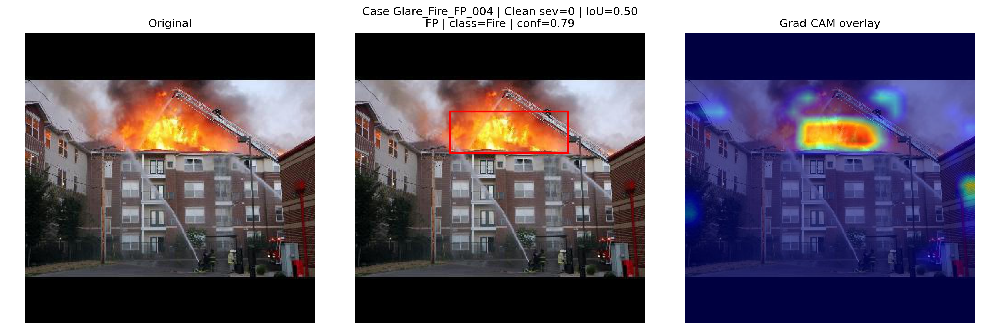

Fog_Smoke_FP_005


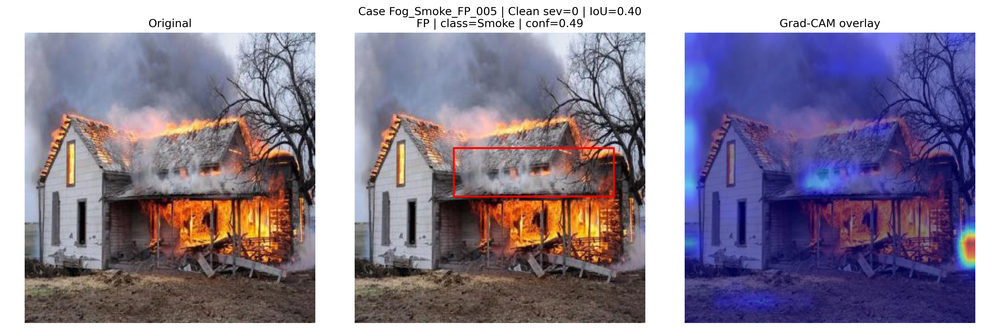

LowLight_FN_009


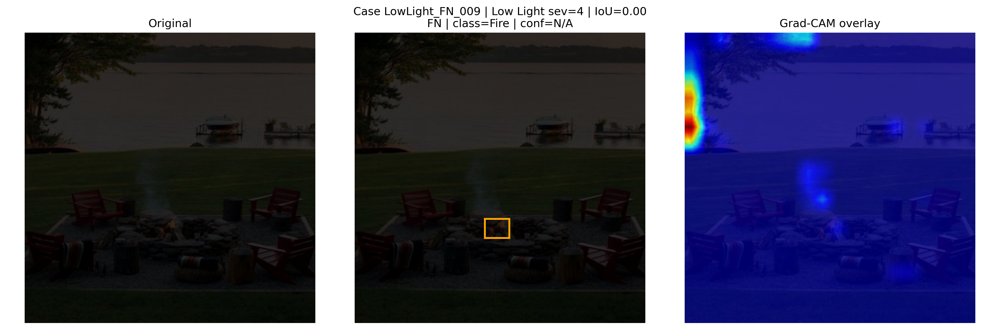

MotionBlur_Failure_013


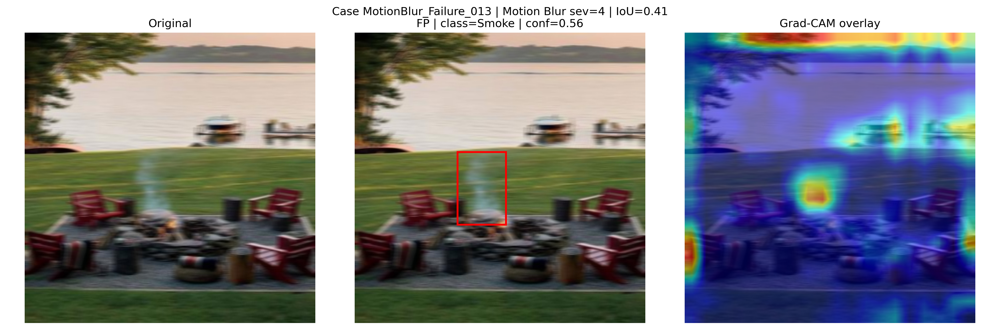

In [16]:
from IPython.display import Image, display

selected_case_ids = ["Glare_Fire_FP_004", "Fog_Smoke_FP_005", "LowLight_FN_009", "MotionBlur_Failure_013"]  # তোমার পছন্দমতো বদলাও

for cid in selected_case_ids:
    path = phase4_xai_cases_df.loc[phase4_xai_cases_df["Case_ID"] == cid, "Figure_Path"].values[0]
    print(cid)
    display(Image(filename=path))

## Cell 13 — Clean vs degraded XAI comparison (same/similar filenames across conditions)

In [17]:
clean_fnames = set(os.listdir(TEST_IMAGES_DIR))
comparison_rows = []

for deg_name, deg_dir in DEGRADATION_DIRS.items():
    sev_dir = os.path.join(deg_dir, f"severity_{HIGH_SEVERITY}", "images")
    if not os.path.isdir(sev_dir):
        continue
    deg_fnames = set(os.listdir(sev_dir)) & clean_fnames
    sample_fnames = sorted(deg_fnames)[:2]
    for fname in sample_fnames:
        clean_path = os.path.join(TEST_IMAGES_DIR, fname)
        deg_path = os.path.join(sev_dir, fname)

        # anchor the comparison CAM to an actual Fire detection/GT box on the clean
        # image if one exists, so both panels explain the SAME object
        clean_label_path = img_to_label_path(TEST_IMAGES_DIR, fname)
        clean_cases = run_inference_and_match(clean_path, clean_label_path)
        fire_idx = CLASS_NAMES.index("Fire") if "Fire" in CLASS_NAMES else 0
        anchor_case = next((c for c in clean_cases if c["type"] in ("TP", "FN")
                             and (c.get("gt_cls") == fire_idx or c.get("pred_cls") == fire_idx)), None)

        fig, axes = plt.subplots(2, 2, figsize=(10, 10))
        for ax_row, (label, path) in zip(axes, [("Clean", clean_path), (f"{deg_name} (sev {HIGH_SEVERITY})", deg_path)]):
            img_bgr = cv2.imread(path)
            img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
            h, w = img_rgb.shape[:2]
            img_resized = cv2.resize(img_rgb, (IMG_SIZE, IMG_SIZE))
            img_float = img_resized.astype(np.float32) / 255.0
            tensor = torch.from_numpy(img_float).permute(2, 0, 1).unsqueeze(0).to(DEVICE)
            tensor.requires_grad_(True)
            box_640 = scale_box_to_input(anchor_case["box"], (h, w), IMG_SIZE) if anchor_case else None
            gray_cam = compute_cam(tensor, class_idx=fire_idx, box_640=box_640)
            overlay = show_cam_on_image(img_float, gray_cam, use_rgb=True)
            ax_row[0].imshow(img_rgb); ax_row[0].set_title(label); ax_row[0].axis("off")
            ax_row[1].imshow(overlay); ax_row[1].set_title(f"{label} -- {XAI_METHOD} (Fire)"); ax_row[1].axis("off")

        plt.tight_layout()
        safe_deg_name = deg_name.replace(" ", "_")
        out_path = os.path.join(FIGURES_DIR, "comparison", f"{safe_deg_name}_{os.path.splitext(fname)[0]}")
        for ext in ("png", "pdf"):
            plt.savefig(f"{out_path}.{ext}", dpi=DPI)
        plt.close()
        comparison_rows.append({"degradation": deg_name, "filename": fname, "figure_path": f"{out_path}.png",
                                 "anchored_to_detection": anchor_case is not None})

print(f"Generated {len(comparison_rows)} clean-vs-degraded comparison figures.")
n_anchored = sum(1 for r in comparison_rows if r["anchored_to_detection"])
print(f"  {n_anchored} / {len(comparison_rows)} were anchored to an actual Fire TP/FN detection; "
      f"the rest fall back to the unanchored global-max target.")

Generated 6 clean-vs-degraded comparison figures.
  6 / 6 were anchored to an actual Fire TP/FN detection; the rest fall back to the unanchored global-max target.


## Cell 14 — Quantitative XAI: Inside-Box Activation Ratio

Definition (exact, as required by the brief):

    Inside-Box Activation Ratio = sum(CAM activation inside GT box) / sum(CAM activation, whole image)

Only computed for cases with a real GT box (TP and FN cases) -- FP cases without a matched GT box
have no ground-truth region to compute this against, and this metric is skipped for them rather
than forced.

In [18]:
def inside_box_ratio(gray_cam, box, img_shape_hw, cam_shape_hw):
    if box is None:
        return None
    orig_h, orig_w = img_shape_hw
    cam_h, cam_w = cam_shape_hw
    sx, sy = cam_w / orig_w, cam_h / orig_h
    x1, y1, x2, y2 = box
    x1, y1, x2, y2 = int(x1 * sx), int(y1 * sy), int(x2 * sx), int(y2 * sy)
    x1, x2 = max(0, min(x1, cam_w)), max(0, min(x2, cam_w))
    y1, y2 = max(0, min(y1, cam_h)), max(0, min(y2, cam_h))
    total = gray_cam.sum()
    if total <= 0 or x2 <= x1 or y2 <= y1:
        return None
    inside = gray_cam[y1:y2, x1:x2].sum()
    return float(inside / total)

activation_ratios = []
for idx, row in phase4_xai_cases_df.iterrows():
    if row["Failure_Type"] not in ("TP", "FN"):
        activation_ratios.append(None)
        continue
    img = cv2.imread(row["Image_Path"])
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    h, w = img_rgb.shape[:2]
    img_resized = cv2.resize(img_rgb, (IMG_SIZE, IMG_SIZE))
    img_float = img_resized.astype(np.float32) / 255.0
    tensor = torch.from_numpy(img_float).permute(2, 0, 1).unsqueeze(0).to(DEVICE)
    tensor.requires_grad_(True)
    gt_cls_name = row["Ground_Truth_Class"]
    cls_idx = CLASS_NAMES.index(gt_cls_name) if gt_cls_name in CLASS_NAMES else 0

    matching = case_inventory_df[case_inventory_df["image_path"] == row["Image_Path"]]
    box = None
    for _, r2 in matching.iterrows():
        if r2["type"] == row["Failure_Type"]:
            box = r2["box"]
            break

    box_640 = scale_box_to_input(box, (h, w), IMG_SIZE) if box is not None else None
    gray_cam = compute_cam(tensor, class_idx=cls_idx, box_640=box_640)
    ratio = inside_box_ratio(gray_cam, box, img_rgb.shape[:2], gray_cam.shape) if box else None
    activation_ratios.append(ratio)

phase4_xai_cases_df["GT_Box_Activation_Ratio"] = activation_ratios
valid_n = phase4_xai_cases_df["GT_Box_Activation_Ratio"].notna().sum()
print(f"Computed GT_Box_Activation_Ratio for {valid_n} / {len(phase4_xai_cases_df)} cases (TP/FN only).")

Computed GT_Box_Activation_Ratio for 14 / 32 cases (TP/FN only).


## Cell 15 — Quantitative plots (only if enough valid cases exist)

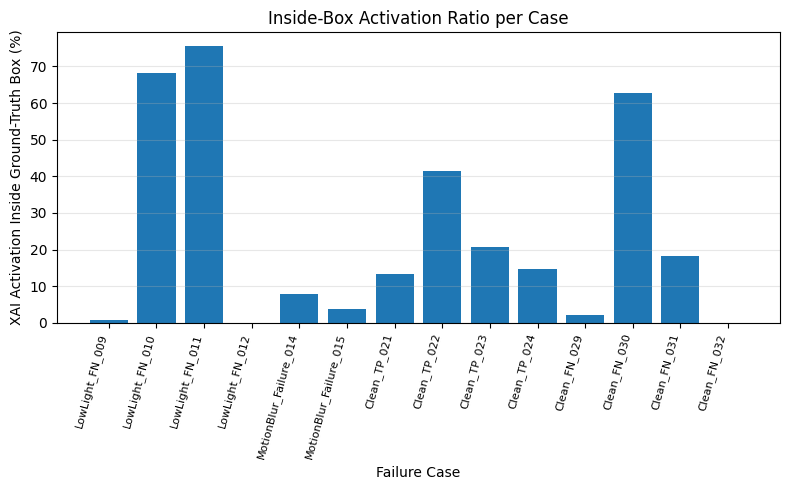

Not enough severity-spread valid cases for a severity-vs-activation-ratio plot -- skipped 
(this is common with small representative-case counts; do not force a misleading plot).


In [19]:
valid_df = phase4_xai_cases_df.dropna(subset=["GT_Box_Activation_Ratio"])

if len(valid_df) >= 2:
    plt.figure(figsize=(8, 5))
    plt.bar(valid_df["Case_ID"], valid_df["GT_Box_Activation_Ratio"] * 100)
    plt.xticks(rotation=75, ha="right", fontsize=8)
    plt.xlabel("Failure Case")
    plt.ylabel("XAI Activation Inside Ground-Truth Box (%)")
    plt.title("Inside-Box Activation Ratio per Case")
    plt.grid(axis="y", alpha=0.3)
    plt.tight_layout()
    for ext in ("png", "pdf"):
        plt.savefig(os.path.join(PLOTS_DIR, f"activation_ratio_per_case.{ext}"), dpi=DPI)
    plt.show()
else:
    print("Not enough valid cases (need >= 2) for the per-case activation-ratio plot -- skipped.")

sev_group = valid_df[valid_df["Degradation"] != "None"].groupby(["Degradation", "Severity"])["GT_Box_Activation_Ratio"].mean().reset_index()
if len(sev_group) >= 2 and sev_group["Severity"].nunique() >= 2:
    plt.figure(figsize=(7, 5))
    for deg in sev_group["Degradation"].unique():
        sub = sev_group[sev_group["Degradation"] == deg]
        plt.plot(sub["Severity"], sub["GT_Box_Activation_Ratio"] * 100, marker="o", label=deg)
    plt.xlabel("Degradation Severity")
    plt.ylabel("Ground-Truth Box Activation Ratio (%)")
    plt.title("Activation Ratio vs Severity")
    plt.legend()
    plt.grid(alpha=0.3)
    plt.tight_layout()
    for ext in ("png", "pdf"):
        plt.savefig(os.path.join(PLOTS_DIR, f"activation_ratio_vs_severity.{ext}"), dpi=DPI)
    plt.show()
else:
    print("Not enough severity-spread valid cases for a severity-vs-activation-ratio plot -- skipped ")
    print("(this is common with small representative-case counts; do not force a misleading plot).")

## Cell 16 — Save CSV / config

In [20]:
csv_path = os.path.join(RESULTS_DIR, "phase4_xai_cases.csv")
phase4_xai_cases_df.to_csv(csv_path, index=False)

summary_rows = phase4_xai_cases_df.groupby(["Category", "Failure_Type"]).size().reset_index(name="count")
summary_csv_path = os.path.join(RESULTS_DIR, "phase4_xai_summary.csv")
summary_rows.to_csv(summary_csv_path, index=False)

config = {
    "model_path": BEST_MODEL_PATH,
    "model_name": "YOLO11s",
    "xai_method": XAI_METHOD,
    "xai_layer": f"torch_model.model[{CANDIDATE_LAYER_IDX}] ({target_layer.__class__.__name__})",
    "iou_match_threshold": IOU_MATCH_THRESHOLD,
    "confidence_threshold": CONF_THRESHOLD,
    "image_size": IMG_SIZE,
    "phase3_root_path": PHASE3_ROOT,
    "output_path": OUTPUT_ROOT,
    "random_seed": SEED,
    "selected_case_ids": phase4_xai_cases_df["Case_ID"].tolist(),
}
config_path = os.path.join(CONFIG_DIR, "phase4_config.json")
with open(config_path, "w") as f:
    json.dump(config, f, indent=2)

print("Saved:", csv_path)
print("Saved:", summary_csv_path)
print("Saved:", config_path)

Saved: /kaggle/working/phase4_xai/results/phase4_xai_cases.csv
Saved: /kaggle/working/phase4_xai/results/phase4_xai_summary.csv
Saved: /kaggle/working/phase4_xai/config/phase4_config.json


## Cell 17 — Final verification + ZIP

In [21]:
print("=== Final Verification ===")
for f in [csv_path, summary_csv_path, config_path]:
    print(f, "exists:", os.path.exists(f))

n_figs = sum(len(files) for _, _, files in os.walk(FIGURES_DIR))
print(f"Total figure files saved under {FIGURES_DIR}: {n_figs}")

zip_path = shutil.make_archive("/kaggle/working/phase4_xai_results", "zip", OUTPUT_ROOT)
print("\nFINAL ZIP:")
print(" ", zip_path)

=== Final Verification ===
/kaggle/working/phase4_xai/results/phase4_xai_cases.csv exists: True
/kaggle/working/phase4_xai/results/phase4_xai_summary.csv exists: True
/kaggle/working/phase4_xai/config/phase4_config.json exists: True
Total figure files saved under /kaggle/working/phase4_xai/figures: 76

FINAL ZIP:
  /kaggle/working/phase4_xai_results.zip


## Cell 18 — Final research summary

In [23]:
print("=" * 60)
print("PHASE 4 SUMMARY")
print("=" * 60)
print("Selected XAI method:", XAI_METHOD)
print("Selected XAI layer  :", config["xai_layer"])
print()
counts = phase4_xai_cases_df["Failure_Type"].value_counts()
print("TP cases analyzed:", counts.get("TP", 0))
print("FP cases analyzed:", counts.get("FP", 0))
print("FN cases analyzed:", counts.get("FN", 0))
print()
for cat in ["Glare_Fire_FP", "Fog_Smoke_FP", "LowLight_FN", "MotionBlur_Failure", "Noise_Failure"]:
    n = len(selected_cases.get(cat, []))
    status = f"{n} case(s) found" if n > 0 else "No representative case found for this failure mode."
    print(f"{cat}: {status}")
print()
print("IMPORTANT: 'Observed_XAI_Focus' and 'Interpretation' columns in phase4_xai_cases.csv are")
print("placeholders ('TO_FILL_AFTER_VISUAL_INSPECTION'). Per the project's own methodological")
print("restriction against hallucinated interpretation, these must be filled in by looking at")
print("each saved figure under phase4_xai/figures/ and describing what is actually observed.")
print()
print("Output root:", OUTPUT_ROOT)
print("Final ZIP  :", zip_path)

PHASE 4 SUMMARY
Selected XAI method: Grad-CAM
Selected XAI layer  : torch_model.model[22] (C3k2)

TP cases analyzed: 4
FP cases analyzed: 18
FN cases analyzed: 10

Glare_Fire_FP: 4 case(s) found
Fog_Smoke_FP: 4 case(s) found
LowLight_FN: 4 case(s) found
MotionBlur_Failure: 4 case(s) found
Noise_Failure: 4 case(s) found

IMPORTANT: 'Observed_XAI_Focus' and 'Interpretation' columns in phase4_xai_cases.csv are
placeholders ('TO_FILL_AFTER_VISUAL_INSPECTION'). Per the project's own methodological
restriction against hallucinated interpretation, these must be filled in by looking at
each saved figure under phase4_xai/figures/ and describing what is actually observed.

Output root: /kaggle/working/phase4_xai
Final ZIP  : /kaggle/working/phase4_xai_results.zip
